#  Lightweight super‑resolution module inspired by ESPCN (Shi et al. 2016).
    https://arxiv.org/pdf/1609.05158

    The block upsamples an image by a factor ``upscale`` (r) using a learned
    sub‑pixel convolution.  An optional *over‑upscale* factor ``over_factor``
    (m) lets you temporarily enlarge the image to ``H*r*m`` and then bring it
    back to ``H*r`` with an antialiased down‑sampler.  This can reveal fine
    details before the final decimation.

    Args:
        in_channels (int): rgb.
        upscale (int): Desired net upscale factor *r* (default =2).
        over_factor (int): Extra overscale *m* (≥1).  .
        act (str): Activation function to use – 'relu' or 'silu'.
        pool (str): Down‑sampler: 'avg' (AvgPool) or 'blur' (depth‑wise blur) or "max".

    Output shape:
        (B, in_channels, H*upscale, W*upscale)

In [1]:
import os
import math
import time
import glob
from collections import OrderedDict 

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.optim import AdamW 

from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid

from PIL import Image 

from tqdm import tqdm

In [5]:

def _get_valid_num_groups(num_channels, target_groups=32):
    if num_channels == 0: return 1
    if num_channels < target_groups:
        for i in range(5, -1, -1):
            g = 2**i
            if g <= num_channels and num_channels % g == 0: return g
        return 1
    if num_channels % target_groups == 0:
        return target_groups
    possible_groups = [g for g in [16, 8, 4, 2, 1] if num_channels % g == 0]
    return max(possible_groups) if possible_groups else 1

class ResBlock(nn.Module):
    def __init__(self, in_chns, out_chns, kSize=3, padding=1, attn_heads=4):
        super().__init__()
        num_groups_gn1 = _get_valid_num_groups(out_chns)
        num_groups_gn2 = _get_valid_num_groups(out_chns)
        self.conv1 = nn.Conv2d(in_chns, out_chns, kernel_size=kSize, padding=padding)
        self.gn1 = nn.GroupNorm(num_groups=num_groups_gn1, num_channels=out_chns)
        self.act1 = nn.SiLU()
        self.conv2 = nn.Conv2d(out_chns, out_chns, kernel_size=kSize, padding=padding)
        self.gn2 = nn.GroupNorm(num_groups=num_groups_gn2, num_channels=out_chns)
        self.act2 = nn.SiLU()
        self.use_attention = False
        if out_chns > 0 and attn_heads > 0 and out_chns % attn_heads == 0:
            self.attention = nn.MultiheadAttention(embed_dim=out_chns, num_heads=attn_heads, batch_first=True)
            self.use_attention = True
        self.skip_conv = nn.Identity()
        if in_chns != out_chns:
            self.skip_conv = nn.Conv2d(in_chns, out_chns, kernel_size=1, bias=False)

    def forward(self, x):
        skip = self.skip_conv(x)
        x_main = self.conv1(x); x_main = self.gn1(x_main); x_main = self.act1(x_main)
        x_main = self.conv2(x_main); x_main = self.gn2(x_main); x_main = self.act2(x_main)
        if self.use_attention:
            b, c, h, w = x_main.size()
            if h * w > 0:
                x_attn = x_main.view(b, c, -1).permute(0, 2, 1).contiguous()
                x_attn, _ = self.attention(x_attn, x_attn, x_attn)
                x_attn = x_attn.permute(0, 2, 1).contiguous().view(b, c, h, w)
                x_main = x_main + x_attn
        return x_main + skip

class SuperRes(nn.Module):
    def __init__(
        self,
        in_channels: int,
        upscale: int = 2,
        over_factor: int = 1,
        act: str = "silu",
        pool: str = "avg",
        noise_std: float = 0.0005,  # Nuovo parametro per il rumore
        post_shuffle_noise_std=1
    ):
        super().__init__()

        if upscale < 1 or over_factor < 1:
            raise ValueError("upscale and over_factor must be ≥ 1")

        r, m = upscale, over_factor
        self.r, self.m = r, m
        self.noise_std = noise_std  # Salva il parametro
        self.post_shuffle_noise_std=post_shuffle_noise_std
        self.conv1 = nn.Conv2d(in_channels, 64, kernel_size=5, stride=1, padding=2)
        self.act1 = nn.SiLU(inplace=True) if act == "silu" else nn.ReLU(inplace=True)

        self.conv2 = nn.Conv2d(64, in_channels * (r * m) ** 2, kernel_size=3, stride=1, padding=1)
        self.pixel_shuffle = nn.PixelShuffle(r * m)
        
        self.res_blocks = nn.Sequential(
            ResBlock(in_channels, 32, attn_heads=0),
            ResBlock(32, 16, attn_heads=0),
            ResBlock(16, in_channels, attn_heads=0),
        )
        self.conv3 = nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1)

        if m > 1:
            if pool == "avg":
                self.down = nn.AvgPool2d(kernel_size=m, stride=m)
            elif pool == "blur":
                self.down = nn.Sequential(
                    nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1,
                              groups=in_channels, bias=False),
                    nn.AvgPool2d(kernel_size=m, stride=m),
                )
            elif pool == "max":
                self.down = nn.MaxPool2d(kernel_size=m, stride=m)
                print("Using max pooling for downsampling, this may not be ideal")
            else:
                raise ValueError("pool must be 'avg' or 'blur' or 'max'")
        else:
            self.down = nn.Identity()

    def add_noise(self, x):
        """Aggiunge rumore gaussiano all'input se noise_std > 0 e in training mode"""
        if self.noise_std > 0 and self.training:
            noise = torch.randn_like(x) * self.noise_std
            return torch.clamp(x + noise, 0.0, 1.0)
        return x
        
    def add_post_shuffle_noise(self, x):
        if self.post_shuffle_noise_std > 0 and self.training:
            noise = torch.randn_like(x) * self.post_shuffle_noise_std
            return torch.clamp(x + noise, 0.0, 1.0)
        return x
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # Aggiungi rumore all'inizio (solo durante training)
        x = self.add_noise(x)
        
        # Resto del forward normale
        x = self.act1(self.conv1(x))
        x = self.pixel_shuffle(self.conv2(x))
        # Rumore 2: Post-PixelShuffle (feature space ad alta risoluzione)
        x = self.add_post_shuffle_noise(x)
        x = self.res_blocks(x)
        x = self.conv3(x)
        x = self.down(x)
        return x


if __name__ == "__main__":
    # Test senza rumore
    lr = torch.randn(1, 3, 64, 64)
    model = SuperRes(3, upscale=2, over_factor=2, act="silu", pool="avg", noise_std=0.0)
    hr = model(lr)
    print("Senza rumore:", lr.shape, "→", hr.shape)
    
    # Test con rumore
    model_noise = SuperRes(3, upscale=2, over_factor=2, act="silu", pool="avg", noise_std=0.02)
    model_noise.train()  # Modalità training per abilitare rumore
    hr_noise = model_noise(lr)
    print("Con rumore (training):", lr.shape, "→", hr_noise.shape)
    
    # Test in eval mode (niente rumore)
    model_noise.eval()
    hr_eval = model_noise(lr)
    print("Con rumore (eval):", lr.shape, "→", hr_eval.shape)
    
    # Verifica che in eval non ci sia rumore
    print("Input uguale in eval?", torch.allclose(lr, lr))  # Ovviamente True
    print("Rumore applicato solo in training mode")

Senza rumore: torch.Size([1, 3, 64, 64]) → torch.Size([1, 3, 128, 128])
Con rumore (training): torch.Size([1, 3, 64, 64]) → torch.Size([1, 3, 128, 128])
Con rumore (eval): torch.Size([1, 3, 64, 64]) → torch.Size([1, 3, 128, 128])
Input uguale in eval? True
Rumore applicato solo in training mode


In [7]:
# -------------------- Cell : parametri + modello + checkpoint --------------------
import torch, os
from pathlib import Path

# === PARAMETRI ======================================================
LOW_RESOLUTION_SIZE = 128
UPSCALE_FACTOR      = 4           # r
OVER_FACTOR_SR      = 2           # m
HIGH_RESOLUTION_SIZE = LOW_RESOLUTION_SIZE * UPSCALE_FACTOR

IN_CHANNELS      = 3
ACTIVATION_FN_SR = "silu"         # "relu" o "silu"
POOLING_TYPE_SR  = "avg"          # "avg", "blur" o "max"

BATCH_SIZE_TRAIN = 16
BATCH_SIZE_VAL   = 16
LEARNING_RATE_SR = 1e-4
NUM_EPOCHS_SR    = 20
NUM_WORKERS_DL   = 2
TRAIN_IMAGES_LIMIT = 40_000
VAL_IMAGES_LIMIT   = 2_000
NOISE1=0.000
NOISE2=0.000



# Path al checkpoint: puoi lasciarlo vuoto "" se vuoi partire da zero
CHECKPOINT_PATH  = "/kaggle/working/sr_r4_m2_silu_avg/ckpt_ep008_L1-0.0155_2025-05-26_04-37-01.pth"
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"[INFO] Dispositivo usato: {DEVICE}")

# === MODELLO =========================================================
print("[INFO] Creo il modello base SuperRes...")
base_model = SuperRes(
    in_channels=IN_CHANNELS,
    upscale=UPSCALE_FACTOR,
    over_factor=OVER_FACTOR_SR,
    act=ACTIVATION_FN_SR,
    pool=POOLING_TYPE_SR,
    noise_std=NOISE1,
    post_shuffle_noise_std=NOISE2
).to(DEVICE)

if torch.cuda.device_count() > 1:
    super_res_model = torch.nn.DataParallel(base_model).to(DEVICE)
    print(f"[INFO] DataParallel attivo su {torch.cuda.device_count()} GPU")
else:
    super_res_model = base_model


# === CHECKPOINT opzionale ===========================================
start_epoch = 1
if CHECKPOINT_PATH and os.path.exists(CHECKPOINT_PATH):
    print(f"[INFO] Provo a caricare il checkpoint: {CHECKPOINT_PATH}")
    ckpt = torch.load(CHECKPOINT_PATH, map_location=DEVICE)
    state = ckpt["model_state"]
    model_keys = list(super_res_model.state_dict().keys())
    ckpt_keys = list(state.keys())

    # --- Se il modello è DataParallel ma i pesi NO, aggiungi "module."
    if all(not k.startswith("module.") for k in ckpt_keys) and all(k.startswith("module.") for k in model_keys):
        print("[INFO] Modello è DataParallel, checkpoint NO: aggiungo 'module.' alle chiavi")
        state = {"module." + k: v for k, v in state.items()}
    # --- Se il modello NON è DataParallel ma i pesi SI, togli "module."
    elif all(k.startswith("module.") for k in ckpt_keys) and all(not k.startswith("module.") for k in model_keys):
        print("[INFO] Modello base, checkpoint DataParallel: rimuovo 'module.' dalle chiavi")
        state = {k.replace("module.", ""): v for k, v in state.items()}
    # --- Se sono uguali, lascia così
    else:
        print("[INFO] Modello e checkpoint compatibili (nessun prefisso da cambiare)")

    super_res_model.load_state_dict(state, strict=True)
    print(f"[INFO] Stato del modello caricato con successo!")
    try:
        start_epoch = ckpt.get("epoch", 0) + 1
    except:
        start_epoch = 1
    print(f"[INFO] Epoca di ripartenza: {start_epoch} (ultimo salvato: {ckpt.get('epoch', 'N/A')})")
    # (optional) carica ottimizzatore se serve
    if "optim_state" in ckpt:
        optimizer = torch.optim.Adam(super_res_model.parameters(), lr=LEARNING_RATE_SR)
        optimizer.load_state_dict(ckpt["optim_state"])
        print("[INFO] Stato ottimizzatore ripristinato")
else:
    print("[INFO] Nessun checkpoint caricato. Allenamento partirà da zero.")

# === INFO modello e parametri totali =================================
num_params = sum(p.numel() for p in super_res_model.parameters() if p.requires_grad)
print(f"[INFO] Numero totale di parametri: {num_params:,}")

print(f"[INFO] Modello pronto. Puoi partire dall’epoca {start_epoch} fino a {NUM_EPOCHS_SR}.")


[INFO] Dispositivo usato: cuda
[INFO] Creo il modello base SuperRes...
[INFO] DataParallel attivo su 2 GPU
[INFO] Provo a caricare il checkpoint: /kaggle/working/sr_r4_m2_silu_avg/ckpt_ep008_L1-0.0155_2025-05-26_04-37-01.pth
[INFO] Modello è DataParallel, checkpoint NO: aggiungo 'module.' alle chiavi
[INFO] Stato del modello caricato con successo!
[INFO] Epoca di ripartenza: 9 (ultimo salvato: 8)
[INFO] Numero totale di parametri: 134,199
[INFO] Modello pronto. Puoi partire dall’epoca 9 fino a 20.


In [3]:
num_params = sum(p.numel() for p in super_res_model.parameters() if p.requires_grad)
print(f"Total params: {num_params:,}")       

NameError: name 'super_res_model' is not defined

In [ ]:
print("Mean conv1 weight:", super_res_model.module.conv1.weight.mean().item() if hasattr(super_res_model, "module") else super_res_model.conv1.weight.mean().item())


# Dataloader with CelebA

In [9]:
# ==================== CELEBA DATALOADER PER SUPER-RESOLUTION ====================
import os
import glob
import random
from pathlib import Path
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image

class CelebADataset(Dataset):
    def __init__(self, img_paths, low_res=128, upscale=2, blur_sigma=0.5):
        """
        Dataset per CelebA Super-Resolution
        Args:
            img_paths: lista dei path alle immagini
            low_res: risoluzione dell'immagine LR (default: 128)
            upscale: fattore di upscaling (default: 2)
            blur_sigma: sigma per GaussianBlur su LR (0 = niente blur)
        """
        self.img_paths = img_paths
        self.low_res = low_res
        self.high_res = low_res * upscale
        self.blur_sigma = blur_sigma
        
        # Transforms per HR (ground truth)
        self.hr_transform = transforms.Compose([
            transforms.Resize((self.high_res, self.high_res)),  # SEMPRE tuple fissa!
            transforms.ToTensor(),  # [0,1]
        ])
        
        # Transforms per LR (input)
        lr_transforms = [
            transforms.Resize((self.low_res, self.low_res)),  # SEMPRE tuple fissa!
            transforms.ToTensor(),  # [0,1]
        ]
        
        # Aggiungi blur opzionale
        if blur_sigma > 0:
            lr_transforms.insert(-1, transforms.GaussianBlur(kernel_size=3, sigma=blur_sigma))
            
        self.lr_transform = transforms.Compose(lr_transforms)
        
    def __len__(self):
        return len(self.img_paths)
    
    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        
        try:
            # Carica immagine
            img = Image.open(img_path).convert('RGB')
            
            # Crea HR e LR
            hr_img = self.hr_transform(img)
            lr_img = self.lr_transform(img)
            
            return lr_img, hr_img
            
        except Exception as e:
            print(f"Errore caricando {img_path}: {e}")
            # Ritorna tensori dummy in caso di errore
            lr_dummy = torch.zeros(3, self.low_res, self.low_res)
            hr_dummy = torch.zeros(3, self.high_res, self.high_res)
            return lr_dummy, hr_dummy

def get_celeba_loaders(
    img_root="/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba",
    low_res=128,
    upscale=2,
    train_limit=20000,
    val_limit=2000,
    blur_sigma=0.5,
    batch_size=8,
    num_workers=2,
    train_val_split=0.9
):
    """
    Crea train e validation loader per CelebA
    
    Returns:
        train_loader, val_loader
    """
    
    print(f"[INFO] Cercando immagini in: {img_root}")
    
    # Trova tutte le immagini jpg
    img_pattern = os.path.join(img_root, "*.jpg")
    all_img_paths = glob.glob(img_pattern)
    
    if not all_img_paths:
        raise FileNotFoundError(f"Nessuna immagine trovata in {img_pattern}")
    
    print(f"[INFO] Trovate {len(all_img_paths)} immagini totali")
    
    # Ordina per consistenza
    all_img_paths.sort()
    
    # Limita il numero totale se necessario
    total_needed = train_limit + val_limit
    if len(all_img_paths) > total_needed:
        all_img_paths = all_img_paths[:total_needed]
        print(f"[INFO] Limitato a {total_needed} immagini totali")
    
    # Split train/val
    split_idx = int(len(all_img_paths) * train_val_split)
    train_paths = all_img_paths[:split_idx][:train_limit]
    val_paths = all_img_paths[split_idx:][:val_limit]
    
    print(f"[INFO] Train: {len(train_paths)} immagini")
    print(f"[INFO] Val: {len(val_paths)} immagini")
    print(f"[INFO] Risoluzione: {low_res}x{low_res} → {low_res*upscale}x{low_res*upscale}")
    print(f"[INFO] Blur sigma: {blur_sigma}")
    
    # Crea datasets
    train_dataset = CelebADataset(train_paths, low_res, upscale, blur_sigma)
    val_dataset = CelebADataset(val_paths, low_res, upscale, blur_sigma)
    
    # Crea dataloaders
    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers,
        pin_memory=True,
        drop_last=True
    )
    
    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=True,
        drop_last=False
    )
    
    # Test shapes
    print("\n[INFO] Test delle shapes:")
    lr_sample, hr_sample = next(iter(train_loader))
    print(f"  Batch LR shape: {lr_sample.shape}")
    print(f"  Batch HR shape: {hr_sample.shape}")
    print(f"  LR range: [{lr_sample.min():.3f}, {lr_sample.max():.3f}]")
    print(f"  HR range: [{hr_sample.min():.3f}, {hr_sample.max():.3f}]")
    
    return train_loader, val_loader

def plot_samples(dataloader, num_samples=4):
    """Visualizza alcuni campioni dal dataloader"""
    # Prendi un batch
    lr_batch, hr_batch = next(iter(dataloader))
    
    # Limita al numero richiesto
    num_samples = min(num_samples, lr_batch.size(0))
    
    fig, axes = plt.subplots(num_samples, 2, figsize=(8, num_samples * 2))
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    for i in range(num_samples):
        lr_img = lr_batch[i]
        hr_img = hr_batch[i]
        
        axes[i, 0].imshow(to_pil_image(lr_img))
        axes[i, 0].set_title(f"LR {lr_img.shape[1]}x{lr_img.shape[2]}")
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(to_pil_image(hr_img))
        axes[i, 1].set_title(f"HR {hr_img.shape[1]}x{hr_img.shape[2]}")
        axes[i, 1].axis('off')
    
    plt.tight_layout()
    plt.show()

# ==================== USO ====================

[INFO] Cercando immagini in: /kaggle/input/celebamaskhq/CelebAMask-HQ/CelebA-HQ-img
[INFO] Trovate 30000 immagini totali
[INFO] Train: 27000 immagini
[INFO] Val: 2000 immagini
[INFO] Risoluzione: 128x128 → 512x512
[INFO] Blur sigma: 0.6

[INFO] Test delle shapes:
  Batch LR shape: torch.Size([16, 3, 128, 128])
  Batch HR shape: torch.Size([16, 3, 512, 512])
  LR range: [0.000, 1.000]
  HR range: [0.000, 1.000]


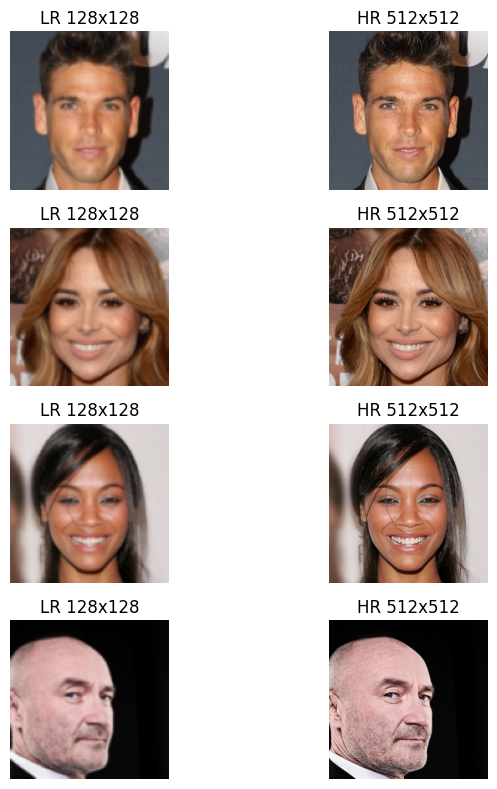

In [10]:
# Crea i loader
train_loader_sr, val_loader_sr = get_celeba_loaders(
    img_root="/kaggle/input/celebamaskhq/CelebAMask-HQ/CelebA-HQ-img",
    low_res=LOW_RESOLUTION_SIZE,
    upscale=UPSCALE_FACTOR,
    train_limit=TRAIN_IMAGES_LIMIT,
    val_limit=VAL_IMAGES_LIMIT,
    blur_sigma=0.6,  # Aggiunge un po' di blur al LR
    batch_size=BATCH_SIZE_TRAIN,
    num_workers=NUM_WORKERS_DL
)

# Visualizza alcuni campioni
plot_samples(train_loader_sr, num_samples=4)

In [11]:
# ==================== TRAINING LOOP ROBUSTO CON CHECKPOINT ====================
import os
import datetime
import torch
import random
import math
from tqdm import tqdm
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image


visual_every = 100


def get_model_size_mb(model):
    """Calcola la dimensione del modello in MB"""
    param_size = 0
    for param in model.parameters():
        param_size += param.nelement() * param.element_size()
    buffer_size = 0
    for buffer in model.buffers():
        buffer_size += buffer.nelement() * buffer.element_size()
    return (param_size + buffer_size) / 1024 / 1024

def check_model_weights(model, model_name="Model"):
    """Controlla se i pesi del modello sembrano validi"""
    warnings = []
    total_params = 0
    zero_params = 0
    
    for name, param in model.named_parameters():
        if param.requires_grad:
            total_params += param.numel()
            zero_params += (param.data == 0).sum().item()
            
            # Check per pesi tutti uguali
            if param.numel() > 1:
                unique_vals = torch.unique(param.data).numel()
                if unique_vals == 1:
                    warnings.append(f"  ⚠️  {name}: tutti i pesi sono uguali ({param.data.flatten()[0]:.6f})")
                elif unique_vals < 5 and param.numel() > 100:
                    warnings.append(f"  ⚠️  {name}: solo {unique_vals} valori unici (possibile problema)")
    
    zero_ratio = zero_params / max(total_params, 1)
    
    print(f"[WEIGHTS CHECK] {model_name}:")
    print(f"  📊 Parametri totali: {total_params:,}")
    print(f"  🔢 Parametri a zero: {zero_params:,} ({zero_ratio*100:.2f}%)")
    
    if warnings:
        print(f"  ⚠️  WARNINGS:")
        for w in warnings:
            print(w)
    else:
        print(f"  ✅ Pesi sembrano normali")
    
    # Esempio di alcuni pesi
    first_param = next(iter(model.parameters()))
    print(f"  📋 Primo layer range: [{first_param.min():.6f}, {first_param.max():.6f}]")
    print(f"  📋 Primo layer mean: {first_param.mean():.6f}, std: {first_param.std():.6f}")

def psnr(x, y):
    """Calcola PSNR tra due tensori"""
    mse = torch.mean((x - y) ** 2)
    return -10.0 * math.log10(mse.item() + 1e-8)
    
# ---------- FIX SAVE_CHECKPOINT ---------------------------------
def save_checkpoint(model, optimizer, epoch,
                    train_loss, val_loss,      # <- usa val_loss
                    save_dir, run_name):

    os.makedirs(save_dir, exist_ok=True)

    # nome file → epoca + val_loss
    timestamp = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
    ckpt_name = f"ckpt_ep{epoch:03d}_L1-{val_loss:.4f}_{timestamp}.pth"  # <- QUI
    ckpt_path = os.path.join(save_dir, ckpt_name)

    # stato modello (gestisce DataParallel)
    model_state = model.module.state_dict() if hasattr(model, "module") else model.state_dict()
    model_type  = "DataParallel" if hasattr(model, "module") else "Standard"

    torch.save({
        "epoch"          : epoch,
        "model_state"    : model_state,
        "optimizer_state": optimizer.state_dict(),
        "train_loss"     : train_loss,
        "val_loss"       : val_loss,
        "model_type"     : model_type,
        "run_name"       : run_name,
        "timestamp"      : timestamp
    }, ckpt_path)

    file_mb = os.path.getsize(ckpt_path) / (1024*1024)
    print(f"  💾 Checkpoint salvato: {ckpt_name}  ({file_mb:.2f} MB)")
    return ckpt_path

def load_checkpoint(checkpoint_path, model, optimizer=None, device='cpu'):
    """Carica checkpoint in modo robusto"""
    if not os.path.exists(checkpoint_path):
        raise FileNotFoundError(f"Checkpoint non trovato: {checkpoint_path}")
    
    print(f"[LOAD] Caricando checkpoint: {checkpoint_path}")
    
    # Carica checkpoint
    checkpoint = torch.load(checkpoint_path, map_location=device)
    
    # Info checkpoint
    print(f"  📅 Epoch: {checkpoint.get('epoch', 'N/A')}")
    print(f"  📊 Train loss: {checkpoint.get('train_loss', 'N/A')}")
    print(f"  📊 Val loss: {checkpoint.get('val_loss', 'N/A')}")
    print(f"  🔧 Tipo modello salvato: {checkpoint.get('model_type', 'Unknown')}")
    
    # Gestisci compatibilità DataParallel
    model_state = checkpoint['model_state']
    current_keys = list(model.state_dict().keys())
    saved_keys = list(model_state.keys())
    
    # Check se serve conversione
    if hasattr(model, 'module'):
        # Modello corrente è DataParallel
        if not saved_keys[0].startswith('module.'):
            # Aggiungi 'module.' ai pesi salvati
            model_state = {f"module.{k}": v for k, v in model_state.items()}
            print("  🔄 Aggiunto 'module.' prefix ai pesi caricati")
    else:
        # Modello corrente è standard
        if saved_keys[0].startswith('module.'):
            # Rimuovi 'module.' dai pesi salvati
            model_state = {k.replace('module.', ''): v for k, v in model_state.items()}
            print("  🔄 Rimosso 'module.' prefix dai pesi caricati")
    
    # Carica stato modello
    model.load_state_dict(model_state, strict=True)
    print("  ✅ Stato modello caricato")
    
    # Carica ottimizzatore se fornito
    if optimizer is not None and 'optimizer_state' in checkpoint:
        optimizer.load_state_dict(checkpoint['optimizer_state'])
        print("  ✅ Stato ottimizzatore caricato")
    
    return checkpoint.get('epoch', 0)

def train_super_resolution(
    model,
    train_loader,
    val_loader,
    num_epochs,
    learning_rate,
    device,
    run_name,
    save_dir="/kaggle/working",
    start_epoch=1,
    checkpoint_path=None
):
    """
    Training loop completo per Super-Resolution
    """
    
    print(f"\n{'='*60}")
    print(f"🚀 INIZIO TRAINING SUPER-RESOLUTION")
    print(f"{'='*60}")
    print(f"📝 Run name: {run_name}")
    print(f"🔢 Epoche: {start_epoch} → {num_epochs}")
    print(f"⚡ Learning rate: {learning_rate}")
    print(f"💻 Device: {device}")
    print(f"💾 Save directory: {save_dir}")
    
    # Setup
    criterion = torch.nn.L1Loss()
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    # 👉  rende l'oggetto visibile globalmente
    globals()['optimizer'] = optimizer
    # Carica checkpoint se fornito
    if checkpoint_path and os.path.exists(checkpoint_path):
        try:
            last_epoch = load_checkpoint(checkpoint_path, model, optimizer, device)
            start_epoch = last_epoch + 1
        except:
            start_epoch=0
        print(f"📂 Ripartenza dall'epoca {start_epoch}")
    
    # Info modello
    model_size = get_model_size_mb(model)
    num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"📊 Modello: {num_params:,} parametri ({model_size:.2f} MB)")
    
    # Check iniziale pesi
    check_model_weights(model, "Modello Iniziale")
    
    # Directory per checkpoint
    run_dir = os.path.join(save_dir, run_name)
    os.makedirs(run_dir, exist_ok=True)
    
    print(f"\n🏁 INIZIO TRAINING:")
    print("-" * 60)
    
    # Training loop
    for epoch in range(start_epoch, num_epochs + 1):
        
        # ================== TRAINING ==================
        model.train()
        train_loss_sum = 0.0
        train_samples = 0
        
        
        with tqdm(train_loader, desc=f"Epoch {epoch:02d}/{num_epochs}") as pbar:
            for batch_idx, (lr_imgs, hr_imgs) in enumerate(pbar):
                # Move to device
                lr_imgs = lr_imgs.to(device, non_blocking=True)
                hr_imgs = hr_imgs.to(device, non_blocking=True)
                
                # Forward pass
                sr_imgs = model(lr_imgs)
                
                # Check output range
                if batch_idx == 0:  # Solo primo batch per non spammare
                    sr_min, sr_max = sr_imgs.min().item(), sr_imgs.max().item()
                    if sr_min == sr_max:
                        print(f"  ⚠️  OUTPUT COSTANTE: min={sr_min:.6f}, max={sr_max:.6f}")
                    elif sr_min < -0.1 or sr_max > 1.1:
                        print(f"  ⚠️  OUTPUT FUORI RANGE: [{sr_min:.3f}, {sr_max:.3f}]")
                
                # Loss e backward
                loss = criterion(sr_imgs, hr_imgs)
                
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                
                # Stats
                train_loss_sum += loss.item() * lr_imgs.size(0)
                train_samples += lr_imgs.size(0)
                if batch_idx % visual_every == 0 and batch_idx > 0:
                    plot_training_samples(model, val_loader, device, num_samples=2)
                
                # Update progress bar
                pbar.set_postfix({
                    'loss': f"{loss.item():.4f}",
                    'avg': f"{train_loss_sum/train_samples:.4f}"
                })
        
        train_loss_avg = train_loss_sum / train_samples
        
        # ================== VALIDATION ==================
        model.eval()
        val_loss_sum = 0.0
        val_samples = 0
        psnr_sum = 0.0
        
        with torch.no_grad():
            for lr_imgs, hr_imgs in val_loader:
                lr_imgs = lr_imgs.to(device, non_blocking=True)
                hr_imgs = hr_imgs.to(device, non_blocking=True)
                
                sr_imgs = model(lr_imgs)
                loss = criterion(sr_imgs, hr_imgs)
                
                val_loss_sum += loss.item() * lr_imgs.size(0)
                val_samples += lr_imgs.size(0)
                
                # PSNR medio del batch
                for i in range(sr_imgs.size(0)):
                    psnr_val = psnr(sr_imgs[i].clamp(0, 1), hr_imgs[i])
                    psnr_sum += psnr_val
        
        val_loss_avg = val_loss_sum / val_samples
        avg_psnr = psnr_sum / val_samples
        
        # ================== LOGGING ==================
        timestamp = datetime.datetime.now().strftime("%H:%M:%S")
        print(f"[{timestamp}] Epoch {epoch:02d}  "
              f"Train L1: {train_loss_avg:.4f}  "
              f"Val L1: {val_loss_avg:.4f}  "
              f"PSNR: {avg_psnr:.2f}dB")
        
        # ================== CHECKPOINT ==================
        ckpt_path = save_checkpoint(
            model, optimizer, epoch, 
            train_loss_avg, val_loss_avg, 
            run_dir, run_name
        )
        
        # Check pesi dopo training
        if epoch % 5 == 0 or epoch == num_epochs:  # Ogni 5 epoche o alla fine
            check_model_weights(model, f"Modello Epoca {epoch}")
        
        # ================== VISUAL CHECK ==================
        if epoch %  visual_every == 0:  # Ogni epoca (puoi cambiare)
            plot_training_samples(model, val_loader, device, num_samples=4)
        
        print("-" * 60)
    
    print(f"\n🎉 TRAINING COMPLETATO!")
    print(f"📁 Checkpoint salvati in: {run_dir}")

def plot_training_samples(model, val_loader, device, num_samples=4):
    """Mostra campioni di output durante training"""
    model.eval()
    
    with torch.no_grad():
        # Prendi un batch random
        data_iter = iter(val_loader)
        lr_batch, hr_batch = next(data_iter)
        
        # Prendi solo i primi num_samples
        lr_batch = lr_batch[:num_samples].to(device)
        hr_batch = hr_batch[:num_samples].to(device)
        
        # Genera SR
        sr_batch = model(lr_batch).clamp(0, 1)
        
        # Plot
        fig, axes = plt.subplots(num_samples, 3, figsize=(12, num_samples * 3))
        if num_samples == 1:
            axes = axes.reshape(1, -1)
        
        for i in range(num_samples):
            lr_img = lr_batch[i].cpu()
            sr_img = sr_batch[i].cpu()
            hr_img = hr_batch[i].cpu()
            
            # Upscale LR per confronto visivo
            lr_up = torch.nn.functional.interpolate(
                lr_img.unsqueeze(0), 
                size=(hr_img.shape[1], hr_img.shape[2]),
                mode='bicubic', 
                align_corners=False
            ).squeeze(0)
            
            # Calcola PSNR
            psnr_val = psnr(sr_img, hr_img)
            
            # Plot
            axes[i, 0].imshow(to_pil_image(lr_up))
            axes[i, 0].set_title(f"LR (bicubic)")
            axes[i, 0].axis('off')
            
            axes[i, 1].imshow(to_pil_image(sr_img))
            axes[i, 1].set_title(f"SR ({psnr_val:.1f}dB)")
            axes[i, 1].axis('off')
            
            axes[i, 2].imshow(to_pil_image(hr_img))
            axes[i, 2].set_title("HR (GT)")
            axes[i, 2].axis('off')
        
        plt.tight_layout()
        plt.show()




🚀 INIZIO TRAINING SUPER-RESOLUTION
📝 Run name: sr_r4_m2_silu_avg
🔢 Epoche: 1 → 20
⚡ Learning rate: 0.0001
💻 Device: cuda
💾 Save directory: /kaggle/working
[LOAD] Caricando checkpoint: /kaggle/working/sr_r4_m2_silu_avg/ckpt_ep008_L1-0.0155_2025-05-26_04-37-01.pth
  📅 Epoch: 8
  📊 Train loss: 0.014563249473233123
  📊 Val loss: 0.015501237504184246
  🔧 Tipo modello salvato: DataParallel
  🔄 Aggiunto 'module.' prefix ai pesi caricati
  ✅ Stato modello caricato
  ✅ Stato ottimizzatore caricato
📂 Ripartenza dall'epoca 9
📊 Modello: 134,199 parametri (0.51 MB)
[WEIGHTS CHECK] Modello Iniziale:
  📊 Parametri totali: 134,199
  🔢 Parametri a zero: 0 (0.00%)
  ✅ Pesi sembrano normali
  📋 Primo layer range: [-0.195762, 0.211188]
  📋 Primo layer mean: -0.001140, std: 0.068712

🏁 INIZIO TRAINING:
------------------------------------------------------------


Epoch 09/20:   0%|          | 0/1687 [00:00<?, ?it/s]

  ⚠️  OUTPUT FUORI RANGE: [-0.080, 1.221]


Epoch 09/20:   6%|▌         | 100/1687 [01:57<30:37,  1.16s/it, loss=0.0148, avg=0.0147]

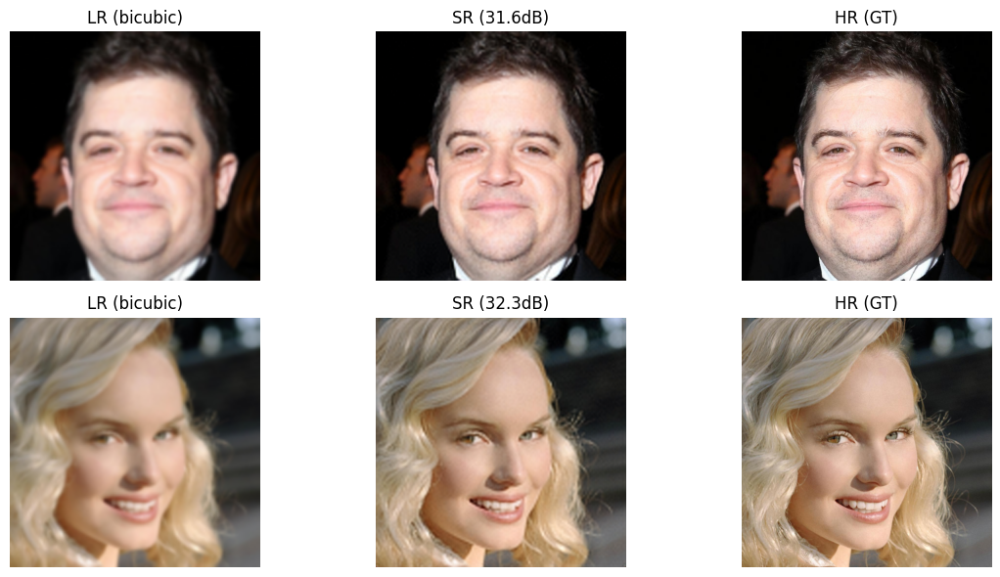

Epoch 09/20:  12%|█▏        | 200/1687 [03:57<29:34,  1.19s/it, loss=0.0149, avg=0.0146]

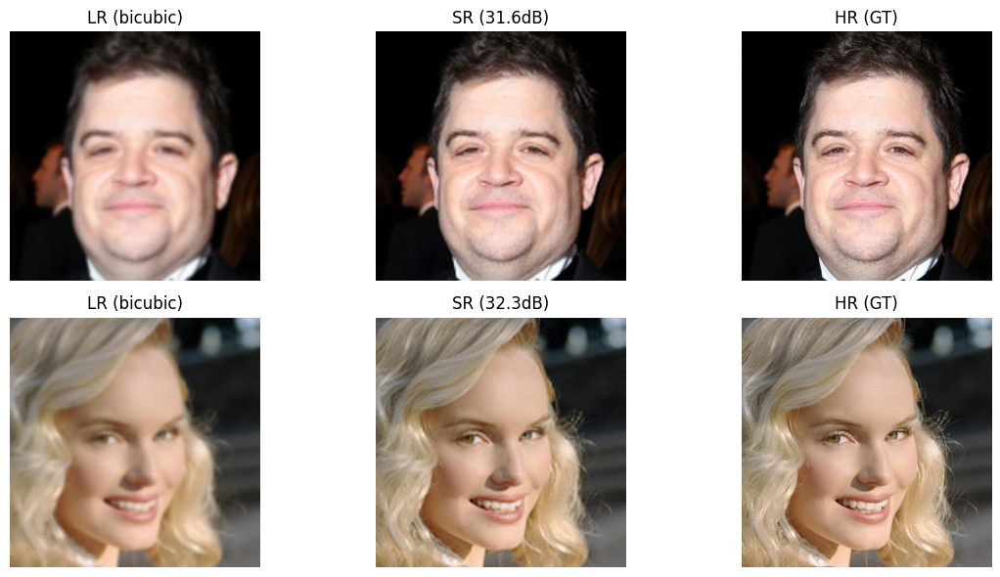

Epoch 09/20:  18%|█▊        | 300/1687 [05:59<27:55,  1.21s/it, loss=0.0167, avg=0.0146]

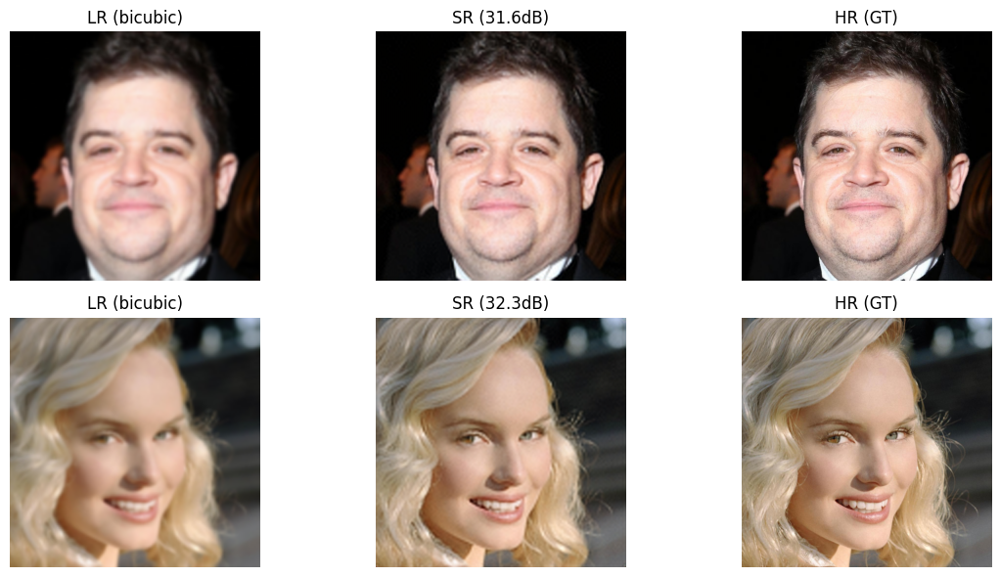

Epoch 09/20:  24%|██▎       | 400/1687 [08:02<26:03,  1.21s/it, loss=0.0161, avg=0.0146]

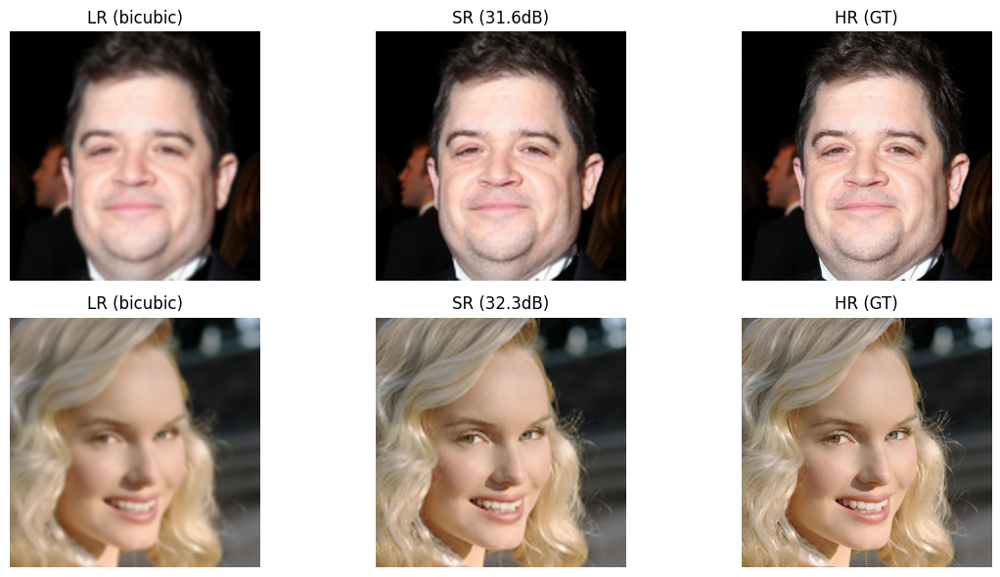

Epoch 09/20:  30%|██▉       | 500/1687 [10:05<24:00,  1.21s/it, loss=0.0141, avg=0.0146]

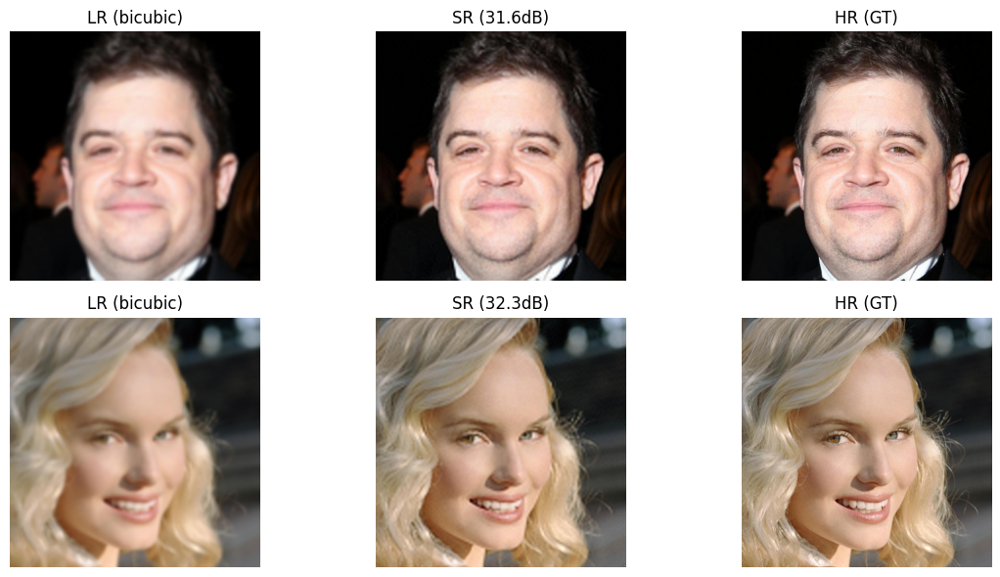

Epoch 09/20:  33%|███▎      | 565/1687 [11:27<22:45,  1.22s/it, loss=0.0155, avg=0.0145]


KeyboardInterrupt: 

In [12]:
# Avvia il training
train_super_resolution(
    model=super_res_model,
    train_loader=train_loader_sr,
    val_loader=val_loader_sr,
    num_epochs=NUM_EPOCHS_SR,
    learning_rate=LEARNING_RATE_SR,
    device=DEVICE,
    run_name=f"sr_r{UPSCALE_FACTOR}_m{OVER_FACTOR_SR}_{ACTIVATION_FN_SR}_{POOLING_TYPE_SR}",
    checkpoint_path=CHECKPOINT_PATH if CHECKPOINT_PATH else None
)

In [ ]:
# ==================== EMERGENCY SAVE (one-liner) ====================
import torch, datetime, inspect, sys

def emergency_save(model_var="model",
                   optim_var="optimizer",
                   epoch_var="current_epoch",
                   prefix="emergency"):
    """
    Salva immediatamente il modello e (se presente) l'optimizer
    dallo scope globale in /kaggle/working/prefix_YYYYmmdd_HHMMSS.pth.
    
    Parametri
    ---------
    model_var : str  (default "model")
        Nome della variabile che contiene torch.nn.Module / DataParallel
    optim_var : str  (default "optimizer")
        Nome della variabile con torch.optim.Optimizer  (facoltativa: se manca salva solo i pesi)
    epoch_var : str  (default "current_epoch")
        Variabile (int) con l'epoca corrente; se assente salva "N/A"
    prefix    : str  (default "emergency")
        Prefisso del file .pth in /kaggle/working
    
    Esempi
    ------
    # dopo Ctrl-C / Stop
    emergency_save()                              # se variabili si chiamano model / optimizer
    emergency_save("super_res_model", "opt")      # se i nomi sono diversi
    emergency_save(model_var="net", optim_var=None)  # solo il modello
    """
    g = globals()

    # ---- trova modello ----
    if model_var not in g or not isinstance(g[model_var], torch.nn.Module):
        print(f"❌ '{model_var}' non trovato o non è nn.Module.\n"
              f"   Chiama emergency_save(model_var='nome_modello', ...)")
        return None
    model = g[model_var]

    # ---- trova optimizer (facoltativo) ----
    optimizer = None
    if optim_var and optim_var in g and isinstance(g[optim_var], torch.optim.Optimizer):
        optimizer = g[optim_var]
    elif optim_var:
        print(f"⚠️  Optimizer '{optim_var}' non trovato – salvo solo il modello.")

    epoch = g.get(epoch_var, "N/A")

    # se DataParallel → togli il wrapper
    state_dict = model.module.state_dict() if hasattr(model, "module") else model.state_dict()

    ts   = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    path = f"/kaggle/working/{prefix}_{ts}.pth"

    save_obj = {"model_state": state_dict,
                "epoch"     : epoch,
                "timestamp" : ts}
    if optimizer is not None:
        save_obj["optimizer_state"] = optimizer.state_dict()

    torch.save(save_obj, path)
    print(f"🚨  EMERGENCY SAVE completato → {path}  (epoch={epoch})")
    return path
emergency_save("super_res_model", "optimizer", "epoch")

In [13]:
# ==================== LIVE SNAPSHOT (safe call) ====================

import torch, inspect
from torch.utils.data import DataLoader

# ---------- definisci live_snapshot solo se non esiste --------------
if "live_snapshot" not in globals():
    def live_snapshot(model=None, optimizer=None, cfg=None,
                      train_loader=None, val_loader=None,
                      last_tr_loss=None, last_val_loss=None):
        g = globals()
        # auto-pick helper
        def pick(obj, cls, *names):
            if obj is not None: return obj
            for n in names:
                if n in g and isinstance(g[n], cls):
                    return g[n]
            # fallback generic scan
            for v in g.values():
                if isinstance(v, cls): return v
            return None
        model       = pick(model, torch.nn.Module,  "model","super_res_model","net")
        optimizer   = pick(optimizer, torch.optim.Optimizer, "optimizer","opt","opt_sr")
        train_loader= pick(train_loader, DataLoader, "train_loader","train_loader_sr")
        val_loader  = pick(val_loader,   DataLoader, "val_loader","val_loader_sr")
        # cfg: cerca dict con chiavi tipiche
        if cfg is None:
            for n in ("CONFIG","CFG","cfg"): 
                if n in g and isinstance(g[n], dict): cfg = g[n]; break
        # loss
        last_tr_loss  = last_tr_loss  or g.get("train_loss_avg")
        last_val_loss = last_val_loss or g.get("val_loss_avg")

        # ---------- stampa summary -------------------------------
        print("="*60)
        print("🔍  LIVE SNAPSHOT")
        print("="*60)
        if model:
            dp   = isinstance(model, torch.nn.DataParallel)
            core = model.module if dp else model
            p    = sum(p.numel() for p in core.parameters() if p.requires_grad)
            print(f"🧩 Model           : {core.__class__.__name__} "
                  f"{'[DP]' if dp else ''}  |  params={p:,}")
            if hasattr(core,"r") and hasattr(core,"m"):
                print(f"   upscale r={core.r}  •  over_factor m={core.m}")
        else:
            print("🧩 Model           : — not found —")
        if optimizer:
            lrs = {i:g["lr"] for i,g in enumerate(optimizer.param_groups)}
            print(f"⚙️  Optimizer       : {optimizer.__class__.__name__}  LR={lrs}")
        if train_loader:
            print(f"📦 Train loader    : {len(train_loader)} batches  "
                  f"({len(train_loader.dataset)} img)"
                  f"  • batch={train_loader.batch_size}")
        if val_loader:
            print(f"📦 Val   loader    : {len(val_loader)} batches  "
                  f"({len(val_loader.dataset)} img)"
                  f"  • batch={val_loader.batch_size}")
        if last_tr_loss is not None or last_val_loss is not None:
            print("📈 Last losses     :", end=" ")
            if last_tr_loss  is not None:  print(f"train={last_tr_loss:.4f}", end="  ")
            if last_val_loss is not None:  print(f"val={last_val_loss:.4f}", end="")
            print()
        if cfg:
            for k in ("low_res","upscale","blur_sigma",
                      "batch_train","batch_val","lr"):
                if k in cfg: print(f"⚙️  {k:12s}: {cfg[k]}")
        print("="*60)

# ---------- CHIAMA live_snapshot (safe) -------------------------------
try:
    live_snapshot()   # auto-detect delle variabili più comuni
except Exception as e:
    print("Snapshot error:", e)


🔍  LIVE SNAPSHOT
🧩 Model           : SuperRes   |  params=51,111
   upscale r=2  •  over_factor m=2
⚙️  Optimizer       : Adam  LR={0: 0.0001}
📦 Train loader    : 1687 batches  (27000 img)  • batch=16
📦 Val   loader    : 125 batches  (2000 img)  • batch=16


In [ ]:
# ============== CONFIG & SETUP (no checkpoint) ==============
import torch, os
from pathlib import Path
from torch import nn

CFG = dict(
    # --- data ------------------------------------------------
    img_root    = "/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba",
    low_res     = 128,
    upscale     = 2,
    blur_sigma  = 0.4,
    train_lim   = 20_000,
    val_lim     = 2_000,
    batch_train = 24,
    batch_val   = 24,
    num_workers = 2,
    # --- optimizer ------------------------------------------
    lr          = 5e-5,
    # --- optional swaps -------------------------------------
    swap_act    = False,   # True → SiLU→ReLU
    swap_pool   = False,   # True → Avg→Max
)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ---- 1. Dataloader ----------------------------------------
train_loader, val_loader = get_celeba_loaders(
    img_root   = CFG["img_root"],
    low_res    = CFG["low_res"],
    upscale    = CFG["upscale"],
    train_limit= CFG["train_lim"],
    val_limit  = CFG["val_lim"],
    blur_sigma = CFG["blur_sigma"],
    batch_size = CFG["batch_train"],
    num_workers= CFG["num_workers"],
)
if CFG["batch_val"] != CFG["batch_train"]:
    val_loader = torch.utils.data.DataLoader(
        val_loader.dataset, batch_size=CFG["batch_val"],
        shuffle=False, num_workers=CFG["num_workers"], pin_memory=True)

# ---- 2. Modello base --------------------------------------
model_base = SuperRes(3, CFG["upscale"], over_factor=2,
                      act="silu", pool="avg").to(DEVICE)

# optional swap
def replace(mdl, from_t, to_t, **kw):
    for n,c in mdl.named_children():
        if isinstance(c, from_t): setattr(mdl, n, to_t(**kw))
        else: replace(c, from_t, to_t, **kw)
if CFG["swap_act"]:
    replace(model_base, nn.SiLU, nn.ReLU, inplace=True)
if CFG["swap_pool"]:
    replace(model_base, nn.AvgPool2d, nn.MaxPool2d, kernel_size=2, stride=2)

# DataParallel se >1 GPU
model = torch.nn.DataParallel(model_base).to(DEVICE) if torch.cuda.device_count() > 1 else model_base

# ---- 3. Optimizer -----------------------------------------
optimizer   = torch.optim.Adam(model.parameters(), lr=CFG["lr"])
start_epoch = 1

print(f"[SETUP] Model pronto  •  LR={CFG['lr']}  •  batch={CFG['batch_train']}/{CFG['batch_val']}")


In [ ]:
# ============== QUICK LOAD CHECKPOINT ======================
CKPT_PATH = "/kaggle/working/sr_r2_m2_silu_avg/ckpt_ep003_L1-0.0091_2025-05-23_01-44-54.pth"  # <− cambia qui
OVERRIDE_LR = None       # es. 1e-5 per cambiare LR, oppure None

def quick_load(ckpt_path, model, optimizer=None, override_lr=None):
    print(f"[LOAD] {ckpt_path}")
    ck  = torch.load(ckpt_path, map_location=DEVICE)
    sd  = ck["model_state"]
    if list(sd)[0].startswith("module.") and not isinstance(model, torch.nn.DataParallel):
        sd = {k.replace("module.",""):v for k,v in sd.items()}
    if not list(sd)[0].startswith("module.") and isinstance(model, torch.nn.DataParallel):
        sd = {f"module.{k}":v for k,v in sd.items()}
    model.load_state_dict(sd, strict=True)
    
    if optimizer and "optimizer_state" in ck:
        optimizer.load_state_dict(ck["optimizer_state"])
        if override_lr:
            for g in optimizer.param_groups: g["lr"] = override_lr
    print(f"✅  pesi caricati  |  epoch salvata: {ck.get('epoch','?')}")
    if override_lr: print(f"↪️  LR impostato a {override_lr}")

quick_load(CKPT_PATH, model, optimizer, OVERRIDE_LR)


In [ ]:
# ==================== INFERENCE RANDOM ====================
import torch
import random
from torchvision.transforms.functional import to_pil_image
import matplotlib.pyplot as plt
import math

def random_inference_check(model, val_loader, device, num_samples=3, show_training_noise=False):
    if show_training_noise:
        model.train()  # <-- CAMBIA QUI!
        print("[INFO] Modello in TRAINING mode - rumore attivo")
    else:
        model.eval()
        print("[INFO] Modello in EVAL mode - nessun rumore")
    
    # Prendi indici random dal dataset
    dataset_size = len(val_loader.dataset)
    random_indices = random.sample(range(dataset_size), num_samples)
    
    def psnr(x, y):
        mse = torch.mean((x - y)**2)
        return -10 * math.log10(mse.item() + 1e-10)
    
    fig, axes = plt.subplots(num_samples, 3, figsize=(12, num_samples * 3))
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    with torch.no_grad():
        for i, idx in enumerate(random_indices):
            # Prendi campione specifico
            lr_img, hr_gt = val_loader.dataset[idx]
            
            # Inference
            lr_batch = lr_img.unsqueeze(0).to(device)
            sr_img = model(lr_batch).clamp(0, 1).cpu().squeeze(0)
            
            # PSNR
            score = psnr(sr_img, hr_gt)
            
            # Plot
            axes[i, 0].imshow(to_pil_image(lr_img))
            axes[i, 0].set_title("Input LR")
            axes[i, 0].axis("off")
            
            axes[i, 1].imshow(to_pil_image(sr_img))
            axes[i, 1].set_title(f"SuperRes\nPSNR={score:.2f}dB")
            axes[i, 1].axis("off")
            
            axes[i, 2].imshow(to_pil_image(hr_gt))
            axes[i, 2].set_title("HR GT")
            axes[i, 2].axis("off")
            
            print(f"Sample {i+1}: Dataset idx {idx}, PSNR = {score:.2f}dB")
    
    plt.tight_layout()
    plt.show()

# Usa così:
random_inference_check(super_res_model, val_loader_sr, DEVICE, num_samples=4, show_training_noise=0
                       
                    
                )

📁 Usando immagini da: /kaggle/input/latdiff256-slightlygood
ℹ️  Schermata 2025-05-23 alle 15.17.33.png: SR range (0.0, 1.0)
ℹ️  Schermata 2025-05-23 alle 13.12.50.png: SR range (0.0, 1.0)
ℹ️  Schermata 2025-05-23 alle 13.12.01.png: SR range (0.0, 0.9159716963768005)
ℹ️  Schermata 2025-05-23 alle 15.21.08.png: SR range (0.0, 0.9753499627113342)
ℹ️  Schermata 2025-05-23 alle 13.13.46.png: SR range (0.0, 1.0)
ℹ️  Schermata 2025-05-23 alle 15.20.22.png: SR range (0.0, 0.9974891543388367)
ℹ️  Schermata 2025-05-22 alle 16.08.28.png: SR range (0.0, 1.0)
ℹ️  Schermata 2025-05-23 alle 15.19.44.png: SR range (0.0, 1.0)
ℹ️  Schermata 2025-05-23 alle 13.12.15.png: SR range (0.0, 1.0)
ℹ️  Schermata 2025-05-23 alle 15.19.14.png: SR range (0.0, 1.0)
ℹ️  Schermata 2025-05-23 alle 15.20.57.png: SR range (0.0, 1.0)
ℹ️  Schermata 2025-05-23 alle 15.20.34.png: SR range (0.0, 1.0)
ℹ️  Schermata 2025-05-23 alle 15.17.42.png: SR range (0.0, 1.0)
ℹ️  Schermata 2025-05-23 alle 15.19.08.png: SR range (0.0, 1.0)

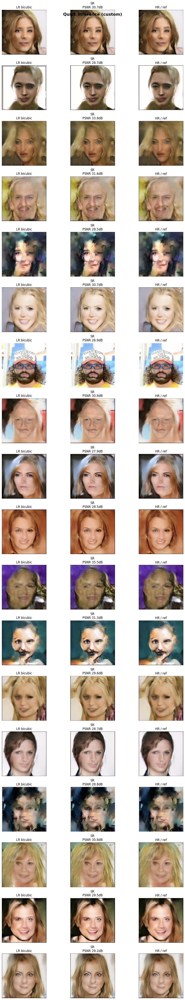

'/kaggle/working/inference_results/quick_inference_20250526_132334_custom_60samples.png'

In [20]:
# ==================== QUICK RANDOM INFERENCE & DEBUG + AUTO-SAVE ====================
import torch, random, math, datetime, os
from pathlib import Path
from PIL import Image
from torchvision import transforms
from torchvision.transforms.functional import to_pil_image
import matplotlib.pyplot as plt
from torchvision.transforms import functional as F

# ----------- parametri principali -------------
LOW_RES     = 128
UPSCALE     = 4
BLUR_SIGMA  = 0.2    # 0 = no blur
SHARP_FACTOR = 1    # 1 = no sharpen, >1 aumenta nitidezza

def quick_random_inference(model_var="super_res_model",
                          device_var="DEVICE", 
                          epoch_var="epoch",
                          loss_var="current_loss",
                          # Scegli fonte dati
                          img_root=None,          # se None usa val_loader
                          val_loader_var="val_loader_sr",  # nome var val_loader
                          # Parametri processing
                          low_res=128, upscale=4,
                          n_samples=8, seed=None,
                          # Salvataggio
                          save_dir="/kaggle/working/inference_results",
                          prefix="quick_inference",
                          auto_save=True):
    """
    Quick inference con auto-save e scelta fonte dati.
    Prende variabili dallo scope globale.
    
    Parametri
    ---------
    model_var : str
        Nome variabile modello nello scope globale
    device_var : str  
        Nome variabile device
    epoch_var : str
        Nome variabile epoca corrente
    loss_var : str
        Nome variabile loss corrente
    img_root : str o None
        • Se str: path cartella con immagini (.jpg/.png) 
        • Se None: usa val_loader_var dal dataset
    val_loader_var : str
        Nome variabile validation loader (usato solo se img_root=None)
    low_res : int
        Risoluzione LR
    upscale : int  
        Fattore upscale
    n_samples : int
        Numero campioni da testare
    seed : int o None
        Seed per riproducibilità
    save_dir : str
        Directory dove salvare
    prefix : str
        Prefisso nome file
    auto_save : bool
        Se True salva automaticamente l'immagine
    
    Esempi
    ------
    # Da validation dataset
    quick_random_inference()
    
    # Da cartella custom
    quick_random_inference(img_root="/path/to/images", n_samples=6)
    
    # Solo visualizza senza salvare
    quick_random_inference(auto_save=False)
    """
    
    # ---- Trova variabili nello scope globale ----
    g = globals()
    
    if model_var not in g or not isinstance(g[model_var], torch.nn.Module):
        print(f"❌ '{model_var}' non trovato o non è nn.Module.")
        return None
        
    if device_var not in g:
        print(f"❌ '{device_var}' non trovato.")
        return None
    
    model = g[model_var]
    device = g[device_var]
    epoch = g.get(epoch_var, "N/A")
    current_loss = g.get(loss_var, None)
    
    if seed is not None:
        random.seed(seed)

    model.eval()
    
    # ---- Info fonte dati ----
    if img_root:
        print(f"📁 Usando immagini da: {img_root}")
        fonte = "custom"
    else:
        if val_loader_var not in g:
            print(f"❌ '{val_loader_var}' non trovato per validation dataset.")
            return None
        val_loader = g[val_loader_var]
        print(f"📊 Usando validation dataset: {val_loader_var}")
        fonte = "val_dataset"

    # ---------- prepara campioni ------------------------------------------------
    if img_root:                             # === CARTELLA LIBERA ===
        files = sorted([p for p in Path(img_root).rglob("*")
                        if p.suffix.lower() in (".jpg",".jpeg",".png")])
        if len(files) == 0:
            raise FileNotFoundError(f"Nessuna immagine trovata in {img_root}")
        picks = random.sample(files, min(n_samples, len(files)))

        # ----------- trasformazione LR ----------------
        tf_lr = transforms.Compose([
            transforms.Resize((low_res, low_res),
                      interpolation=transforms.InterpolationMode.BICUBIC),
        
            # --- blur opzionale -------------------------------------------------
            transforms.GaussianBlur(kernel_size=5, sigma=BLUR_SIGMA)
                 if BLUR_SIGMA > 0 else transforms.Lambda(lambda x: x),
        
            # --- sharpen opzionale ----------------------------------------------
            transforms.Lambda(lambda x: F.adjust_sharpness(x, SHARP_FACTOR))
                 if SHARP_FACTOR != 1 else transforms.Lambda(lambda x: x),
        
            transforms.ToTensor()
        ])

        tf_hr = transforms.Compose([
            transforms.Resize((low_res*upscale, low_res*upscale),
                              interpolation=transforms.InterpolationMode.BICUBIC),
            transforms.ToTensor()
        ])

        samples = []
        for p in picks:
            img = Image.open(p).convert("RGB")
            samples.append((tf_lr(img), tf_hr(img), p.name))
            
    else:                                    # === DATASET VAL ESISTENTE ===
        ds  = val_loader.dataset
        idx = random.sample(range(len(ds)), min(n_samples, len(ds)))
        samples = [(ds[i][0], ds[i][1], f"val_idx_{i}") for i in idx]

    # ---------- utils -----------------------------------------------------------
    def psnr(a, b):
        mse = torch.mean((a - b) ** 2)
        return -10 * math.log10(mse.item() + 1e-8)

    # ---------- plot setup ------------------------------------------------------
    rows = len(samples)
    fig, ax = plt.subplots(rows, 3, figsize=(12, rows*3))
    if rows == 1: 
        ax = ax.reshape(1, -1)
    
    # ---- Titolo principale ----
    title_parts = [f"Quick Inference ({fonte})"]
    if epoch != "N/A":
        title_parts.append(f"Epoch: {epoch}")
    if current_loss is not None:
        title_parts.append(f"Loss: {current_loss:.4f}")
    
    main_title = " | ".join(title_parts)
    fig.suptitle(main_title, fontsize=16, fontweight='bold')

    # ---------- inference e plot -----------------------------------------------
    with torch.no_grad():
        for r, (lr, hr, label) in enumerate(samples):
            # inference
            sr = model(lr.unsqueeze(0).to(device)).clamp(0,1).cpu().squeeze(0)

            # bicubic LR-up
            lr_up = torch.nn.functional.interpolate(
                        lr.unsqueeze(0),
                        size=hr.shape[1:], mode="bicubic",
                        align_corners=False).squeeze(0)

            # debug range
            rng = (sr.min().item(), sr.max().item())
            if rng[0] == rng[1]:
                print(f"⚠️  {label}: output costante ({rng[0]:.4f})")
            else:
                print(f"ℹ️  {label}: SR range {rng}")

            # PSNR vs HR (o bicubic se hr==lr_up)
            ref   = hr if hr.shape == sr.shape else lr_up
            score = psnr(sr, ref)

            # plot
            ax[r,0].imshow(to_pil_image(lr_up)); ax[r,0].set_title("LR bicubic")
            ax[r,1].imshow(to_pil_image(sr));    ax[r,1].set_title(f"SR\nPSNR {score:.1f}dB")
            ax[r,2].imshow(to_pil_image(hr));    ax[r,2].set_title("HR / ref")
            for c in range(3): 
                ax[r,c].axis("off")

    plt.tight_layout()
    
    # ---------- salvataggio automatico ------------------------------------------
    if auto_save:
        os.makedirs(save_dir, exist_ok=True)
        
        # Genera nome file
        ts = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
        filename_parts = [f"{prefix}_{ts}"]
        
        if fonte == "custom":
            filename_parts.append("custom")
        else:
            filename_parts.append("val")
            
        if epoch != "N/A":
            filename_parts.append(f"ep{epoch}")
        if current_loss is not None:
            filename_parts.append(f"loss{current_loss:.4f}")
            
        filename_parts.append(f"{n_samples}samples")
        filename = "_".join(filename_parts) + ".png"
        filepath = os.path.join(save_dir, filename)
        
        # Salva
        plt.savefig(filepath, dpi=150, bbox_inches='tight', facecolor='white')
        print(f"🖼️  QUICK INFERENCE SAVE → {filepath}")
        print(f"    Fonte: {fonte} | Samples: {n_samples} | Epoch: {epoch}")
        
    plt.show()
    return filepath if auto_save else None


# ==================== ESEMPI D'USO ====================

# 1️⃣ Da validation dataset (default)
#quick_random_inference()










# 2️⃣ Da cartella custom con 6 campioni  
quick_random_inference(img_root="/kaggle/input/latdiff256-slightlygood", n_samples=60)

# 3️⃣ Più campioni senza salvare
# quick_random_inference(n_samples=12, auto_save=False)

# 4️⃣ Con seed per riproducibilità
# quick_random_inference(seed=42, n_samples=4)

# 5️⃣ Con nomi variabili custom
# quick_random_inference(model_var="my_model", device_var="my_device")

In [ ]:
# Verifica se il modello ha il rumore
if hasattr(super_res_model, 'noise_std'):
    print(f"Noise std: {super_res_model.noise_std}")
elif hasattr(super_res_model, 'module') and hasattr(super_res_model.module, 'noise_std'):
    print(f"Noise std: {super_res_model.module.noise_std}")
else:
    print("Il modello caricato NON ha il parametro noise_std!")

In [ ]:
# ==================== QUICK RANDOM INFERENCE & DEBUG ====================
import torch, random, math
from pathlib import Path
from PIL import Image
from torchvision import transforms
from torchvision.transforms.functional import to_pil_image
import matplotlib.pyplot as plt
 
from torchvision.transforms import functional as F   # <-- in cima al file

# ----------- parametri principali -------------
LOW_RES     = 128
UPSCALE     = 4
BLUR_SIGMA  =  0    # 0 = no blur
SHARP_FACTOR = 1    # 1 = no sharpen, >1 aumenta nitidezza

def quick_random_inference(model,
                           device,
                           img_root=None,          # se None usa val_loader
                           val_loader=None,
                           low_res=128, upscale=2,
                           n_samples=8, seed=None):
    """
    • Se img_root è un path ⇒ pesca immagini random da lì (.jpg/.png)  
    • Altrimenti usa il val_loader passato  
    • Mostra LR-bicubic, SR, HR/ref con PSNR e range valori
    """

    if seed is not None:
        random.seed(seed)

    model.eval().to(device)

    # ---------- prepara campioni ------------------------------------------------
    if img_root:                             # === CARTELLA LIBERA ===
        files = sorted([p for p in Path(img_root).rglob("*")
                        if p.suffix.lower() in (".jpg",".jpeg",".png")])
        if len(files) == 0:
            raise FileNotFoundError(f"Nessuna immagine trovata in {img_root}")
        picks = random.sample(files, min(n_samples, len(files)))


        # ----------- trasformazione LR ----------------
        tf_lr = transforms.Compose([
            transforms.Resize((LOW_RES, LOW_RES),
                      interpolation=transforms.InterpolationMode.BICUBIC),
        
            # --- blur opzionale -------------------------------------------------
            transforms.GaussianBlur(kernel_size=5, sigma=BLUR_SIGMA)
                 if BLUR_SIGMA > 0 else transforms.Lambda(lambda x: x),
        
            # --- sharpen opzionale ----------------------------------------------
            transforms.Lambda(lambda x: F.adjust_sharpness(x, SHARP_FACTOR))
                 if SHARP_FACTOR != 1 else transforms.Lambda(lambda x: x),
        
            transforms.ToTensor()
        ])

        tf_hr = transforms.Compose([
            transforms.Resize((low_res*upscale, low_res*upscale),
                              interpolation=transforms.InterpolationMode.BICUBIC),
            transforms.ToTensor()
        ])

        samples = []
        for p in picks:
            img = Image.open(p).convert("RGB")
            samples.append((tf_lr(img), tf_hr(img), p.name))
    elif val_loader:                         # === DATASET VAL ESISTENTE ===
        ds  = val_loader.dataset
        idx = random.sample(range(len(ds)), min(n_samples, len(ds)))
        samples = [(ds[i][0], ds[i][1], f"val_idx_{i}") for i in idx]
    else:
        raise ValueError("Fornisci img_root o val_loader")

    # ---------- utils -----------------------------------------------------------
    def psnr(a, b):
        mse = torch.mean((a - b) ** 2)
        return -10 * math.log10(mse.item() + 1e-8)

    # ---------- plot ------------------------------------------------------------
    rows = len(samples)
    fig, ax = plt.subplots(rows, 3, figsize=(12, rows*3))
    if rows == 1: ax = ax.reshape(1, -1)

    with torch.no_grad():
        for r, (lr, hr, label) in enumerate(samples):
            # inference
            sr = model(lr.unsqueeze(0).to(device)).clamp(0,1).cpu().squeeze(0)

            # bicubic LR-up
            lr_up = torch.nn.functional.interpolate(
                        lr.unsqueeze(0),
                        size=hr.shape[1:], mode="bicubic",
                        align_corners=False).squeeze(0)

            # debug range
            rng = (sr.min().item(), sr.max().item())
            if rng[0] == rng[1]:
                print(f"⚠️  {label}: output costante ({rng[0]:.4f})")
            else:
                print(f"ℹ️  {label}: SR range {rng}")

            # PSNR vs HR (o bicubic se hr==lr_up)
            ref   = hr if hr.shape == sr.shape else lr_up
            score = psnr(sr, ref)

            # plot
            ax[r,0].imshow(to_pil_image(lr_up)); ax[r,0].set_title("LR bicubic")
            ax[r,1].imshow(to_pil_image(sr));    ax[r,1].set_title(f"SR\nPSNR {score:.1f}dB")
            ax[r,2].imshow(to_pil_image(hr));    ax[r,2].set_title("HR / ref")
            for c in range(3): ax[r,c].axis("off")

    plt.tight_layout(); plt.show()


# --------------------- USO ---------------------------------
# 1) se hai un val_loader già pronto:
# quick_random_inference(model=super_res_model, device=DEVICE,
#                        val_loader=val_loader_sr, n_samples=4)

# 2) per provarlo su tue foto in una cartella:
quick_random_inference(model=super_res_model,
                       device=DEVICE,
                       img_root="/kaggle/input/latdiff256-slightlygood",
                       low_res=128, upscale=4,
                       n_samples=80)
